In [17]:
import sys, os, warnings
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager as fm
import seaborn as sns

warnings.filterwarnings("ignore")

# ── 데이터 경로: used_dataset 스냅샷 (EDA 직접 사용 데이터) ──
DATA    = Path("/home/dlwhdtmd/OR-project/used_dataset")
ADMIN   = DATA / "admin"      # 행정경계(시군구 폴리곤)
BURN    = DATA / "burn"       # 2019 고성·속초 dNBR burn-scar
FIRE    = DATA / "fire"       # safemap 발화점·화재 캐시
POLES   = DATA / "poles"      # 전주 1.38M 피처
WEATHER = DATA / "weather"    # 관측기상·보간기상
assert DATA.exists(), f"데이터 경로 없음: {DATA}"

# pfire 모듈(B-1 GEE 재생성 셀)용 소스 경로 — 데이터와 무관, 있을 때만 사용
ROOT = Path("/home/dlwhdtmd/PF-EBM-OR")
if (ROOT / "src").exists():
    sys.path.insert(0, str(ROOT / "src"))

# ── 한글 폰트 등록 (NanumGothic) — sns.set_theme 뒤에 적용해야 덮어쓰이지 않음 ──
sns.set_theme(style="whitegrid", context="notebook")
_KFONT = "/usr/share/fonts/truetype/nanum/NanumGothic.ttf"
fm.fontManager.addfont(_KFONT)
_FP = fm.FontProperties(fname=_KFONT)
mpl.rcParams["font.family"] = _FP.get_name()
mpl.rcParams["axes.unicode_minus"] = False
mpl.rcParams["figure.dpi"] = 110
mpl.rcParams["savefig.bbox"] = "tight"
print("font:", _FP.get_name(), "| 한글 테스트: 강원 전주 화재위험")
print("DATA:", DATA, "| 존재:", DATA.exists())

font: NanumGothic | 한글 테스트: 강원 전주 화재위험
DATA: /home/dlwhdtmd/OR-project/used_dataset | 존재: True


## 데이터 import

In [18]:
# 사용 데이터 카탈로그 (파일, 단위, 역할) — used_dataset 스냅샷의 EDA 직접사용 데이터
CATALOG = [
    # key,                rel_path,                                  unit,         role
    ("전주 위치·지형",    "poles/pole_features.parquet",             "전주 1.38M", "고도/경사/사면/식생/도로·산림 근접"),
    ("전주 토지피복",     "poles/pole_landcover_filled.parquet",     "전주 1.38M", "환경부 토지피복 중분류 l2_code (산림/농경/초지/시가화…)"),
    ("연료 취약성 S_p",   "poles/pole_static_overlay.parquet",       "전주 1.38M", "정적 연료·지형 결합 취약성 S_p와 구성요소(mu_*)"),
    ("위성 연료지수",     "poles/s2_features.parquet",               "전주 1.38M", "Sentinel-2 pre-season NDVI/NDMI/NBR(연료 수분·량)"),
    ("전주 시군구",       "poles/pole_sgg.parquet",                  "전주 1.38M", "전주→시군구 매핑(공간조인)"),
    ("화재(행정기록)",    "fire/safemap_positives.parquet",          "발생 928",   "산불발생이력(좌표+원인+면적). 연도균형, 2011~2024"),
    ("화재 토지피복",     "fire/safemap_fire_landcover.parquet",     "발화 916",   "safemap 발화점 × ESA 토지피복 × 월"),
    ("관측기상(지점)",    "weather/aws_obs_daily.parquet",           "지점×일",    "강원 107 AWS/ASOS 관측 일자료(TA/HM/WS/RN/풍향)"),
    ("관측소 좌표·고도",  "weather/aws_stations_coords_elev.csv",    "지점 109",   "ASOS 15 + AWS 94, 좌표·DEM 고도"),
    ("전주 보간기상",     "weather/pole_weather_obs.parquet",        "전주 1.38M", "고도보정 IDW 보간 시즌 기상(obs_ta/hm/ws/rn)"),
]
rows = []
for key, rel, unit, role in CATALOG:
    p = DATA / rel
    fname = Path(rel).name
    if not p.exists():
        rows.append({"분류": key, "파일": fname, "행수": "MISSING", "단위": unit, "역할": role}); continue
    if fname.endswith(".parquet"):
        import pyarrow.parquet as pq
        n = pq.read_metadata(p).num_rows
        cols = list(pq.read_schema(p).names)
    else:
        n = sum(1 for _ in open(p)) - 1
        cols = list(pd.read_csv(p, nrows=1).columns)
    rows.append({"분류": key, "파일": fname, "행수": f"{n:,}", "단위": unit, "역할": role,
                 "n_cols": len(cols)})
inventory = pd.DataFrame(rows)
pd.set_option("display.max_colwidth", 60)
inventory[["분류","파일","행수","단위","역할"]]

,분류,파일,행수,단위,역할
0,전주 위치·지형,pole_features.parquet,"1,387,831",전주 1.38M,고도/경사/사면/식생/도로·산림 근접
1,전주 토지피복,pole_landcover_filled.parquet,"1,387,831",전주 1.38M,환경부 토지피복 중분류 l2_code (산림/농경/초지/시가화…)
2,연료 취약성 S_p,pole_static_overlay.parquet,"1,387,831",전주 1.38M,정적 연료·지형 결합 취약성 S_p와 구성요소(mu_*)
3,위성 연료지수,s2_features.parquet,"1,387,831",전주 1.38M,Sentinel-2 pre-season NDVI/NDMI/NBR(연료 수분·량)
4,전주 시군구,pole_sgg.parquet,"1,387,831",전주 1.38M,전주→시군구 매핑(공간조인)
5,화재(행정기록),safemap_positives.parquet,928,발생 928,"산불발생이력(좌표+원인+면적). 연도균형, 2011~2024"
6,화재 토지피복,safemap_fire_landcover.parquet,916,발화 916,safemap 발화점 × ESA 토지피복 × 월
7,관측기상(지점),aws_obs_daily.parquet,"377,822",지점×일,강원 107 AWS/ASOS 관측 일자료(TA/HM/WS/RN/풍향)
8,관측소 좌표·고도,aws_stations_coords_elev.csv,109,지점 109,"ASOS 15 + AWS 94, 좌표·DEM 고도"
9,전주 보간기상,pole_weather_obs.parquet,"1,387,831",전주 1.38M,고도보정 IDW 보간 시즌 기상(obs_ta/hm/ws/rn)


findfont: Failed to find font weight bold, now using 600.


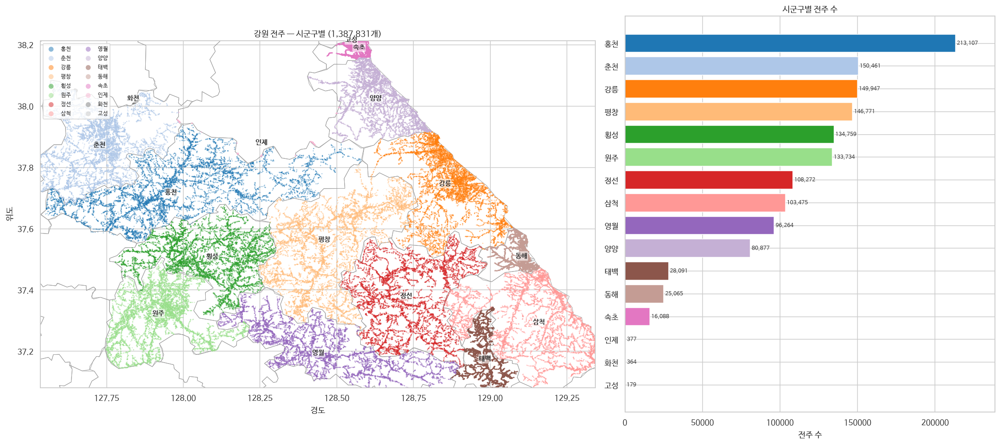

In [19]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt, matplotlib.font_manager as fm
import geopandas as gpd

# 한글 폰트
_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

# 전주 + 시군구 매핑
poles = pd.read_csv(POLES / "gangwon_poles_4326.csv").merge(
    pd.read_parquet(POLES / "pole_sgg.parquet"), on="pole_id", how="left")
poles["sgg"] = poles["sgg"].fillna("미상")

# 행정경계(배경용)
adf = pd.read_csv(ADMIN / "admin_gangwon.csv")
admin = gpd.GeoDataFrame(adf, geometry=gpd.GeoSeries.from_wkt(adf["wkt"]), crs=4326)

# 색 지정 (전주 많은 순)
cats  = poles["sgg"].value_counts().index.tolist()
cmap  = plt.get_cmap("tab20")
color = {c: cmap(i % 20) for i, c in enumerate(cats)}

fig, axes = plt.subplots(1, 2, figsize=(20, 9), gridspec_kw={"width_ratios": [1.5, 1]})

# (좌) 시군구별 색 지도
ax = axes[0]
admin.boundary.plot(ax=ax, color="0.6", linewidth=0.6, zorder=1)        # 경계선
samp = pd.concat(                                                       # 그룹별 샘플
    [g.sample(min(len(g), 12000), random_state=0) for _, g in poles.groupby("sgg")],
    ignore_index=True,
)
for c in cats:
    d = samp[samp.sgg == c]
    ax.scatter(d.lon, d.lat, s=2, color=color[c], alpha=0.5, linewidths=0, label=c, zorder=2)
for c in cats:                                                          # 시군구 이름 라벨
    d = poles[poles.sgg == c]
    if c != "미상":
        ax.text(d.lon.median(), d.lat.median(), c, fontsize=10, weight="bold",
                ha="center", va="center", zorder=3,
                bbox=dict(boxstyle="round,pad=0.1", fc="white", ec="none", alpha=0.6))
ax.set_xlim(poles.lon.quantile(.001), poles.lon.quantile(.999))        # 강원으로 크롭
ax.set_ylim(poles.lat.quantile(.001), poles.lat.quantile(.999))
ax.set_aspect("equal"); ax.set_title(f"강원 전주 — 시군구별 ({len(poles):,}개)")
ax.set_xlabel("경도"); ax.set_ylabel("위도")
ax.legend(markerscale=5, fontsize=8, ncol=2, loc="upper left")

# (우) 시군구별 전주 수
ax2 = axes[1]
vc = poles["sgg"].value_counts()
ax2.barh(vc.index[::-1], vc.values[::-1], color=[color[c] for c in vc.index[::-1]])
ax2.set_title("시군구별 전주 수"); ax2.set_xlabel("전주 수")
for i, v in enumerate(vc.values[::-1]):
    ax2.text(v, i, f" {v:,}", va="center", fontsize=8)
ax2.margins(x=0.12)

plt.tight_layout(); plt.show()

findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


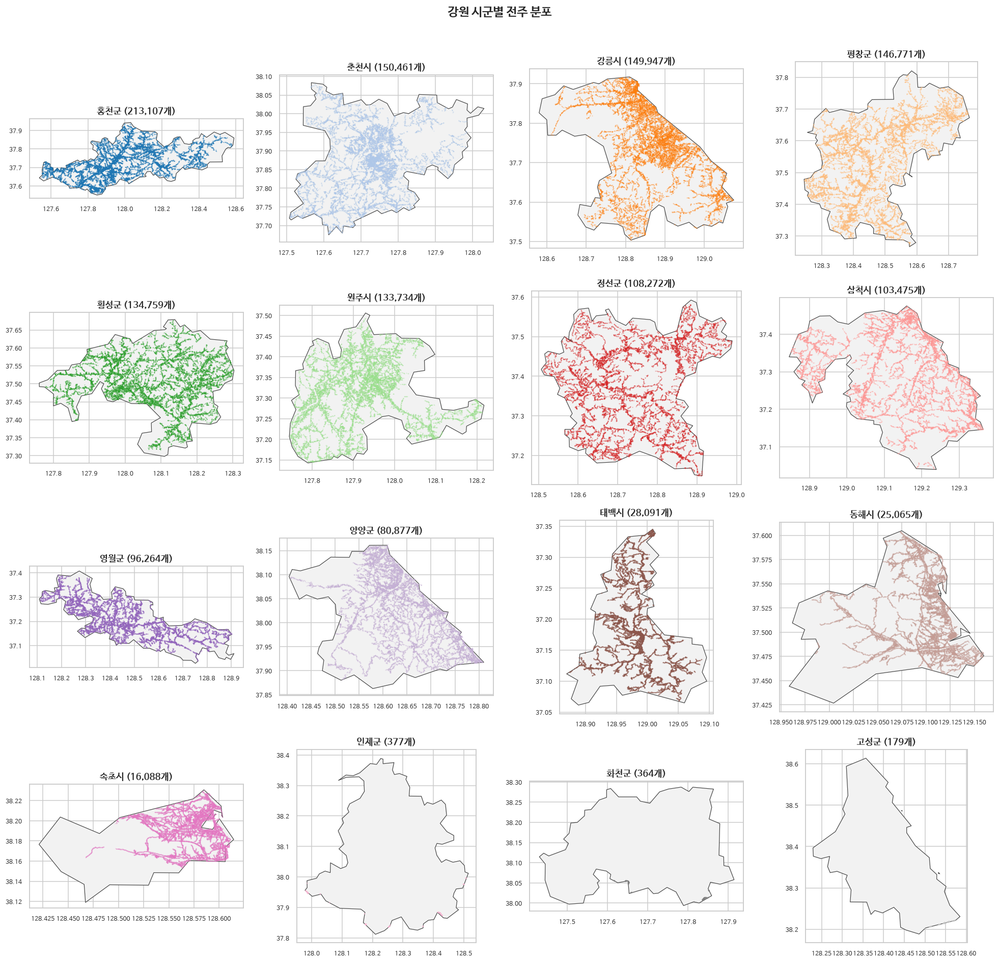

In [20]:
import numpy as np
import polars as pl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import geopandas as gpd
from shapely import wkt as _wkt

# 한글 폰트 설정
_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

# 1. 고속 데이터 로드 및 조인 (Polars Engine 사용)
# Read CSV & Parquet instantly via Polars (Rust core)
poles_pl = pl.read_csv(POLES / "gangwon_poles_4326.csv")
sgg_pl = pl.read_parquet(POLES / "pole_sgg.parquet")

# Left Join 및 결측치 처리 (pandas의 fillna 대신 fill_null)
poles_pl = poles_pl.join(sgg_pl, on="pole_id", how="left").with_columns(
    pl.col("sgg").fill_null("미상")
)

# 2. 행정경계 데이터 로드 (Polars -> GeoPandas 변환)
adf_pl = pl.read_csv(ADMIN / "admin_gangwon.csv")
adf_pd = adf_pl.to_pandas() # 시각화를 위해 Pandas 프레임 변환
adf_pd["geometry"] = adf_pd["wkt"].apply(_wkt.loads)
admin = gpd.GeoDataFrame(adf_pd, geometry="geometry", crs=4326).set_index("sig_kor_nm")

# 3. 매핑 및 정렬 (Polars에서 Value Counts 연산 수행)
# 전주 개수 기준 내림차순 정렬 및 '미상' 제외 추출
sgg_counts = (
    poles_pl.filter(pl.col("sgg") != "미상")["sgg"]
    .value_counts(sort=True)
)
cats = sgg_counts["sgg"].to_list()

# 색상 지정 (tab20)
cmap = plt.get_cmap("tab20")
color = {c: cmap(i % 20) for i, c in enumerate(cats)}

# 매핑 딕셔너리 (데이터의 '춘천' -> 행정경계의 '춘천시')
short2full = {n[:-1]: n for n in admin.index if len(n) > 1}

# 4. 서브플롯 그리드 설정 (4x4 구조)
fig, axes = plt.subplots(4, 4, figsize=(18, 17))
axes_flat = axes.ravel()

# 5. 시군구별 루프 및 독립적 크롭 시각화
for i, short in enumerate(cats):
    if i >= len(axes_flat): 
        break
    
    ax = axes_flat[i]
    full = short2full.get(short, short)
    
    # 해당 시군구 데이터 필터링 (Polars의 고속 필터링 연산)
    d_pl = poles_pl.filter(pl.col("sgg") == short)
    total_count = len(d_pl)
    
    # 시각화 표현을 위해 최대 20,000개 고속 샘플링 후 변환
    sample_size = min(20000, total_count)
    s_pd = d_pl.sample(n=sample_size, seed=1).to_pandas()
    
    # 행정경계 폴리곤 가져오기 및 그리기
    if full in admin.index:
        poly = admin.loc[full, "geometry"]
        gpd.GeoSeries([poly], crs=4326).plot(
            ax=ax, facecolor="#F2F2F2", edgecolor="#444444", linewidth=0.8, zorder=1
        )
        
        # 바운더리 기준 5% 여백 크롭 설정
        minx, miny, maxx, maxy = poly.bounds
        mx, my = (maxx - minx) * 0.05, (maxy - miny) * 0.05
        ax.set_xlim(minx - mx, maxx + mx)
        ax.set_ylim(miny - my, maxy + my)
    else:
        # 행정경계가 없을 경우 데이터 기준으로 크롭
        ax.set_xlim(s_pd["lon"].min(), s_pd["lon"].max())
        ax.set_ylim(s_pd["lat"].min(), s_pd["lat"].max())

    # 전주 산점도 플롯 (Polars에서 변환된 최적화 데이터 기반)
    ax.scatter(s_pd["lon"], s_pd["lat"], s=1.5, color=color[short], alpha=0.4, linewidths=0, zorder=2)
    
    # 타이틀 및 스타일 설정
    ax.set_title(f"{full} ({total_count:,}개)", fontsize=12, weight="bold")
    ax.set_aspect("equal")
    ax.tick_params(labelsize=8)

# 6. 남는 빈 서브플롯 숨기기
for j in range(len(cats), len(axes_flat)):
    axes_flat[j].axis("off")

# 상단 메인 타이틀
fig.suptitle("강원 시군별 전주 분포", fontsize=16, weight="bold", y=1.01)

plt.tight_layout()
plt.show()

In [26]:
import polars as pl, numpy as np
import matplotlib.pyplot as plt, matplotlib.font_manager as fm
import seaborn as sns, geopandas as gpd, pandas as pd

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

ORDER_T = ["농업","초지","산림","시가화","습지","나지","수역"]
COLOR = dict(zip(ORDER_T, ["#fbc02d","#9ccc65","#2e7d32","#e53935","#26c6da","#8d6e63","#1e88e5"]))

df = (pl.read_csv(POLES / "gangwon_poles_4326.csv")
      .join(pl.read_parquet(POLES / "pole_sgg.parquet"),              on="pole_id", how="left")
      .join(pl.read_parquet(POLES / "pole_landcover_filled.parquet"), on="pole_id", how="left")
      .with_columns(pl.col("sgg").fill_null("미상"))
      .rename({"lc_group": "지형"}))            # 환경부+ESA 통합 대분류

SGG_ORDER = df.group_by("sgg").len().sort("len", descending=True)["sgg"].to_list()
ct = (df.group_by(["sgg","지형"]).len()
        .pivot(values="len", index="sgg", on="지형", aggregate_function="first").fill_null(0)
        .sort(by=pl.col("sgg").replace_strict({s:i for i,s in enumerate(SGG_ORDER)}, default=99)))
COLS = [c for c in ORDER_T if c in ct.columns]
M    = ct.select(COLS).to_numpy().astype(float)
ROWS = ct["sgg"].to_list()
P    = M / M.sum(1, keepdims=True)
print(f"전주 {df.height:,} | 미상 {df.filter(pl.col('지형')=='미상').height} | "
      f"ESA로 채운 전주 {df.filter(pl.col('lc_source')=='esa').height:,}")

전주 1,387,831 | 미상 0 | ESA로 채운 전주 0


findfont: Failed to find font weight bold, now using 600.


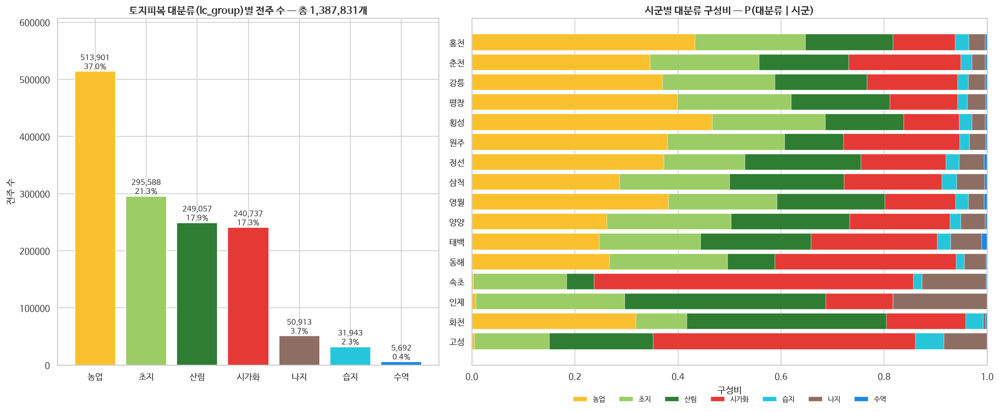

대분류 분포: {'농업': '513,901 (37.0%)', '초지': '295,588 (21.3%)', '산림': '249,057 (17.9%)', '시가화': '240,737 (17.3%)', '나지': '50,913 (3.7%)', '습지': '31,943 (2.3%)', '수역': '5,692 (0.4%)'}


In [27]:
# ── 토지피복 대분류(lc_group)별 전주 분포 — 자립 셀(전역 공유 없음) ──
# 대분류 = 환경부+ESA 통합 7분류(농업·초지·산림·시가화·습지·나지·수역).
# ※ 아래 중분류(l2_code) 셀과의 유일한 차이 = '시가화'를 '시가지 + 도로(교통)'로 쪼갠 것.
import polars as pl, numpy as np
import matplotlib.pyplot as plt, matplotlib.font_manager as fm

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

ORDER1 = ["농업", "초지", "산림", "시가화", "습지", "나지", "수역"]
COLOR1 = dict(zip(ORDER1, ["#fbc02d", "#9ccc65", "#2e7d32", "#e53935", "#26c6da", "#8d6e63", "#1e88e5"]))

df1 = (pl.read_parquet(POLES / "pole_landcover_filled.parquet").select(["pole_id", "lc_group"])
       .join(pl.read_parquet(POLES / "pole_sgg.parquet"), on="pole_id", how="left")
       .with_columns(pl.col("sgg").fill_null("미상")))
N1 = df1.height
SGG1 = df1.group_by("sgg").len().sort("len", descending=True)["sgg"].to_list()
ct1 = (df1.group_by(["sgg", "lc_group"]).len()
       .pivot(values="len", index="sgg", on="lc_group", aggregate_function="first").fill_null(0)
       .sort(by=pl.col("sgg").replace_strict({s: i for i, s in enumerate(SGG1)}, default=99)))
COLS1 = [c for c in ORDER1 if c in ct1.columns]
M1 = ct1.select(COLS1).to_numpy().astype(float)
ROWS1 = ct1["sgg"].to_list()
P1 = M1 / M1.sum(1, keepdims=True)
col_tot1 = M1.sum(0); order1 = np.argsort(col_tot1)[::-1]
cats1 = [COLS1[i] for i in order1]; tot1 = col_tot1[order1]

fig, axes = plt.subplots(1, 2, figsize=(18, 7.5), gridspec_kw={"width_ratios": [1, 1.35]})
ax = axes[0]
ax.bar(cats1, tot1, color=[COLOR1[c] for c in cats1], edgecolor="white")
for i, v in enumerate(tot1):
    ax.text(i, v, f"{int(v):,}\n{v/N1*100:.1f}%", ha="center", va="bottom", fontsize=10)
ax.set_title(f"토지피복 대분류(lc_group)별 전주 수 — 총 {N1:,}개", fontsize=13, weight="bold")
ax.set_ylabel("전주 수"); ax.margins(y=0.18)
ax2 = axes[1]; left = np.zeros(len(ROWS1))
for j, c in enumerate(COLS1):
    ax2.barh(ROWS1, P1[:, j], left=left, color=COLOR1[c], label=c, edgecolor="white", linewidth=0.3)
    left += P1[:, j]
ax2.set_xlim(0, 1); ax2.invert_yaxis()
ax2.set_title("시군별 대분류 구성비 — P(대분류 | 시군)", fontsize=13, weight="bold"); ax2.set_xlabel("구성비")
ax2.legend(ncol=len(COLS1), loc="upper center", bbox_to_anchor=(0.5, -0.07), fontsize=9, frameon=False)
plt.tight_layout(); plt.show()
print("대분류 분포:", {c: f"{int(tot1[i]):,} ({tot1[i]/N1*100:.1f}%)" for i, c in enumerate(cats1)})

findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


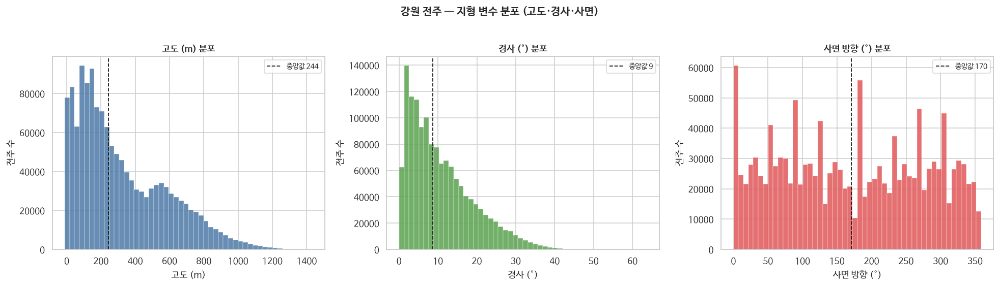

In [28]:
# ── 지형 변수(고도·경사·사면)별 전주 분포 — pole_features.parquet ──
import polars as pl, numpy as np, matplotlib.pyplot as plt

pf = pl.read_parquet(POLES / "pole_features.parquet",
                     columns=["elevation", "slope", "aspect"]).to_pandas()

specs = [("elevation", "고도 (m)",      "#4e79a7", None),
         ("slope",     "경사 (°)",      "#59a14f", None),
         ("aspect",    "사면 방향 (°)", "#e15759", (0, 360))]   # aspect=-1(평지) 제외

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, (col, label, c, rng) in zip(axes, specs):
    v = pf[col].to_numpy()
    if rng is not None:
        v = v[(v >= rng[0]) & (v <= rng[1])]
    ax.hist(v, bins=50, color=c, alpha=0.85, edgecolor="white", linewidth=0.3)
    ax.axvline(np.median(v), color="k", ls="--", lw=1.2, label=f"중앙값 {np.median(v):.0f}")
    ax.set_title(f"{label} 분포", fontsize=12, weight="bold")
    ax.set_xlabel(label); ax.set_ylabel("전주 수")
    ax.legend(fontsize=9, loc="upper right")

fig.suptitle("강원 전주 — 지형 변수 분포 (고도·경사·사면)", fontsize=14, weight="bold", y=1.02)
plt.tight_layout(); plt.show()


findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


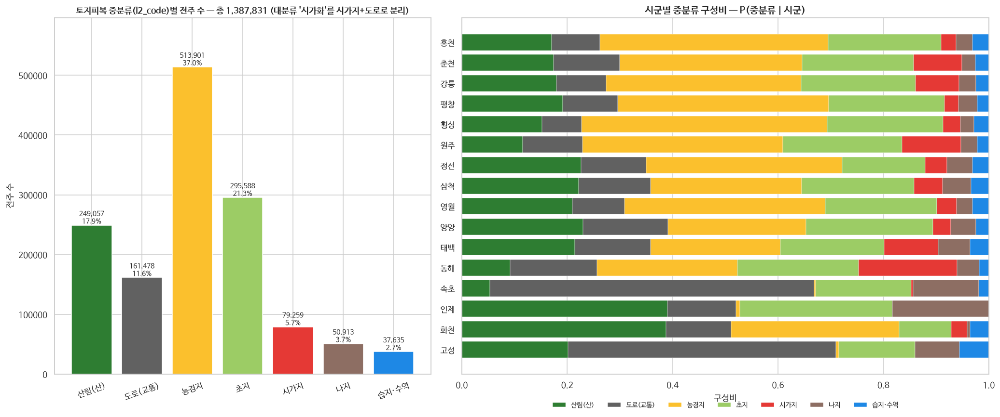

중분류 분포: {'산림(산)': '249,057 (17.9%)', '도로(교통)': '161,478 (11.6%)', '농경지': '513,901 (37.0%)', '초지': '295,588 (21.3%)', '시가지': '79,259 (5.7%)', '나지': '50,913 (3.7%)', '습지·수역': '37,635 (2.7%)'}
확인: 대분류 시가화 = 중분류 시가지(79,259) + 도로(161,478) = 240,737


In [29]:
# ── 토지피복 중분류(l2_code)별 전주 분포 — 자립 셀(전역 이름 _2, 충돌 없음) ──
# 중분류 = 환경부 토지피복 중분류(l2_code) 직접 라벨을 7군으로 묶음(파생 아님).
# ※ 대분류 대비 유일한 차이: '시가화'를 '시가지 + 도로(교통, 150)'로 분리 → 도로 위 전주를 드러냄.
import polars as pl, numpy as np
import matplotlib.pyplot as plt, matplotlib.font_manager as fm

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

L2_GROUP2 = {
    "150": "도로(교통)",
    "310": "산림(산)", "320": "산림(산)", "330": "산림(산)",
    "210": "농경지", "220": "농경지", "230": "농경지", "240": "농경지", "250": "농경지",
    "410": "초지", "420": "초지", "430": "초지",
    "110": "시가지", "120": "시가지", "130": "시가지", "140": "시가지", "160": "시가지",
    "610": "나지", "620": "나지",
    "510": "습지·수역", "520": "습지·수역", "710": "습지·수역", "720": "습지·수역",
}
ORDER2 = ["산림(산)", "도로(교통)", "농경지", "초지", "시가지", "나지", "습지·수역"]
COLOR2 = dict(zip(ORDER2, ["#2e7d32", "#616161", "#fbc02d", "#9ccc65", "#e53935", "#8d6e63", "#1e88e5"]))

df2 = (pl.read_parquet(POLES / "pole_landcover_filled.parquet").select(["pole_id", "l2_code"])
       .join(pl.read_parquet(POLES / "pole_sgg.parquet"), on="pole_id", how="left")
       .with_columns(pl.col("sgg").fill_null("미상"))
       .with_columns(pl.col("l2_code").cast(pl.Utf8).replace_strict(L2_GROUP2, default="기타").alias("유형")))
N2 = df2.height
n_etc = df2.filter(pl.col("유형") == "기타").height
if n_etc:
    print(f"⚠ 미매핑(기타) 전주 {n_etc:,}개 — 그림서 제외됨(l2_code 코드체계 확인 필요)")
SGG2 = df2.group_by("sgg").len().sort("len", descending=True)["sgg"].to_list()
ct2 = (df2.group_by(["sgg", "유형"]).len()
       .pivot(values="len", index="sgg", on="유형", aggregate_function="first").fill_null(0)
       .sort(by=pl.col("sgg").replace_strict({s: i for i, s in enumerate(SGG2)}, default=99)))
COLS2 = [c for c in ORDER2 if c in ct2.columns]
M2 = ct2.select(COLS2).to_numpy().astype(float)
ROWS2 = ct2["sgg"].to_list()
P2 = M2 / M2.sum(1, keepdims=True)
tot2 = {r[0]: r[1] for r in df2.group_by("유형").len().iter_rows()}
cats2 = [c for c in ORDER2 if c in tot2]

fig, ax = plt.subplots(1, 2, figsize=(19, 8), gridspec_kw={"width_ratios": [1, 1.4]})
ax[0].bar(cats2, [tot2[c] for c in cats2], color=[COLOR2[c] for c in cats2], edgecolor="white")
for i, c in enumerate(cats2):
    ax[0].text(i, tot2[c], f"{tot2[c]:,}\n{tot2[c]/N2*100:.1f}%", ha="center", va="bottom", fontsize=9)
ax[0].set_title(f"토지피복 중분류(l2_code)별 전주 수 — 총 {N2:,} (대분류 '시가화'를 시가지+도로로 분리)", fontsize=12, weight="bold")
ax[0].set_ylabel("전주 수"); ax[0].margins(y=0.16); ax[0].tick_params(axis="x", labelrotation=20)
left = np.zeros(len(ROWS2))
for j, c in enumerate(COLS2):
    ax[1].barh(ROWS2, P2[:, j], left=left, color=COLOR2[c], label=c, edgecolor="white", linewidth=0.3)
    left += P2[:, j]
ax[1].set_xlim(0, 1); ax[1].invert_yaxis()
ax[1].set_title("시군별 중분류 구성비 — P(중분류 | 시군)", fontsize=13, weight="bold"); ax[1].set_xlabel("구성비")
ax[1].legend(ncol=len(COLS2), loc="upper center", bbox_to_anchor=(0.5, -0.06), fontsize=9, frameon=False)
plt.tight_layout(); plt.show()
print("중분류 분포:", {c: f"{tot2[c]:,} ({tot2[c]/N2*100:.1f}%)" for c in cats2})
print(f"확인: 대분류 시가화 = 중분류 시가지({tot2.get('시가지',0):,}) + 도로({tot2.get('도로(교통)',0):,}) = {tot2.get('시가지',0)+tot2.get('도로(교통)',0):,}")

findfont: Failed to find font weight bold, now using 600.


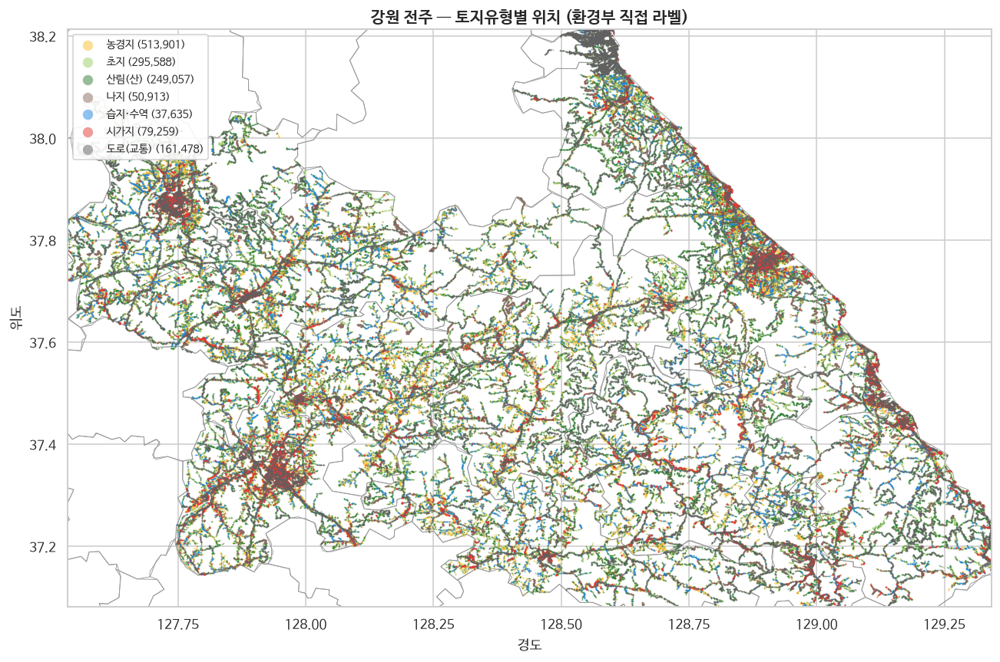

findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


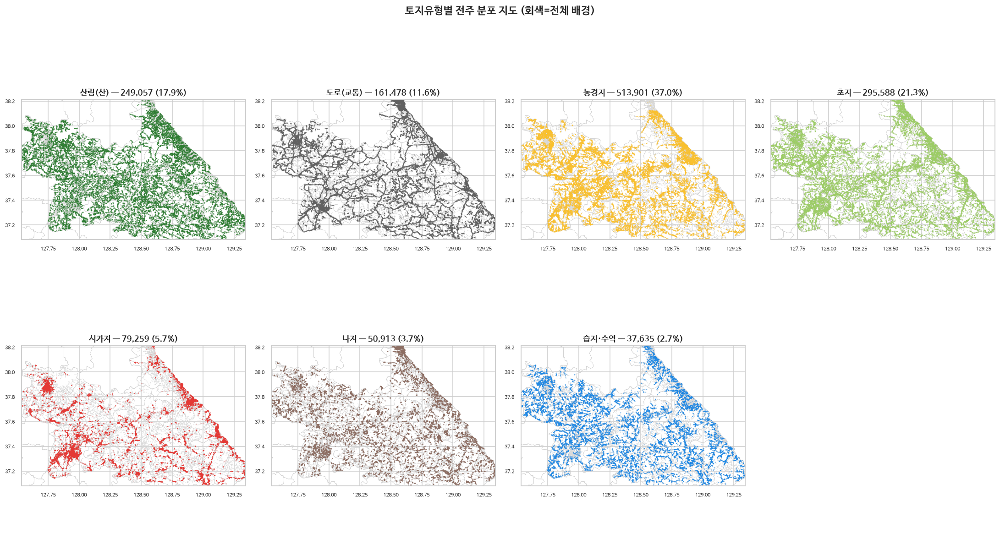

In [30]:
# ── 지도 버전: 전주를 토지유형 색으로 칠한 강원 지도 (환경부 직접 라벨) ──
import polars as pl, numpy as np, pandas as pd
import matplotlib.pyplot as plt, matplotlib.font_manager as fm
import geopandas as gpd

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

L2_GROUP = {
    "150": "도로(교통)",
    "310": "산림(산)", "320": "산림(산)", "330": "산림(산)",
    "210": "농경지", "220": "농경지", "230": "농경지", "240": "농경지", "250": "농경지",
    "410": "초지", "420": "초지", "430": "초지",
    "110": "시가지", "120": "시가지", "130": "시가지", "140": "시가지", "160": "시가지",
    "610": "나지", "620": "나지",
    "510": "습지·수역", "520": "습지·수역", "710": "습지·수역", "720": "습지·수역",
}
ORDER = ["산림(산)", "도로(교통)", "농경지", "초지", "시가지", "나지", "습지·수역"]
COLOR = dict(zip(ORDER, ["#2e7d32", "#616161", "#fbc02d", "#9ccc65",
                         "#e53935", "#8d6e63", "#1e88e5"]))

# 전주 좌표 + 토지유형 + 행정경계
df = (pl.read_parquet(POLES / "pole_features.parquet", columns=["pole_id", "lon", "lat"])
      .join(pl.read_parquet(POLES / "pole_landcover_filled.parquet").select(["pole_id", "l2_code"]),
            on="pole_id", how="left")
      .with_columns(pl.col("l2_code").replace_strict(L2_GROUP, default="기타").alias("유형"))).to_pandas()
adf = pd.read_csv(ADMIN / "admin_gangwon.csv")
admin = gpd.GeoDataFrame(adf, geometry=gpd.GeoSeries.from_wkt(adf["wkt"]), crs=4326)
xlim = (df.lon.quantile(.001), df.lon.quantile(.999))   # 강원으로 크롭(북쪽 좌표오염 제거)
ylim = (df.lat.quantile(.001), df.lat.quantile(.999))
cats = [c for c in ORDER if (df["유형"] == c).any()]
cnt = {c: int((df["유형"] == c).sum()) for c in cats}

# (1) 오버레이 지도 — 흔한 유형 아래, 도로·시가지 위로
porder = ["농경지", "초지", "산림(산)", "나지", "습지·수역", "시가지", "도로(교통)"]
fig, ax = plt.subplots(figsize=(12, 12))
admin.boundary.plot(ax=ax, color="0.6", lw=0.6, zorder=1)
for c in porder:
    if c not in cats:
        continue
    d = df[df["유형"] == c].sample(min(cnt[c], 80000), random_state=0)
    ax.scatter(d.lon, d.lat, s=1.2, color=COLOR[c], alpha=0.5, lw=0,
               label=f"{c} ({cnt[c]:,})", zorder=2)
ax.set_xlim(*xlim); ax.set_ylim(*ylim); ax.set_aspect("equal")
ax.set_title("강원 전주 — 토지유형별 위치 (환경부 직접 라벨)", fontsize=14, weight="bold")
ax.set_xlabel("경도"); ax.set_ylabel("위도")
ax.legend(markerscale=8, fontsize=9, loc="upper left", framealpha=0.9)
plt.tight_layout(); plt.show()

# (2) 소형 다중지도 — 유형별 공간 분포 (회색=전체 배경)
fig, axes = plt.subplots(2, 4, figsize=(20, 11)); axes = axes.ravel()
bg = df.sample(min(len(df), 120000), random_state=1)
for k, c in enumerate(cats):
    ax = axes[k]
    admin.boundary.plot(ax=ax, color="0.8", lw=0.4, zorder=1)
    ax.scatter(bg.lon, bg.lat, s=0.5, color="0.85", alpha=0.4, lw=0, zorder=1)
    d = df[df["유형"] == c].sample(min(cnt[c], 50000), random_state=0)
    ax.scatter(d.lon, d.lat, s=1.3, color=COLOR[c], alpha=0.6, lw=0, zorder=2)
    ax.set_xlim(*xlim); ax.set_ylim(*ylim); ax.set_aspect("equal")
    ax.set_title(f"{c} — {cnt[c]:,} ({cnt[c]/len(df)*100:.1f}%)", fontsize=12, weight="bold")
    ax.tick_params(labelsize=7)
for j in range(len(cats), len(axes)):
    axes[j].axis("off")
fig.suptitle("토지유형별 전주 분포 지도 (회색=전체 배경)", fontsize=15, weight="bold", y=1.0)
plt.tight_layout(); plt.show()


findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


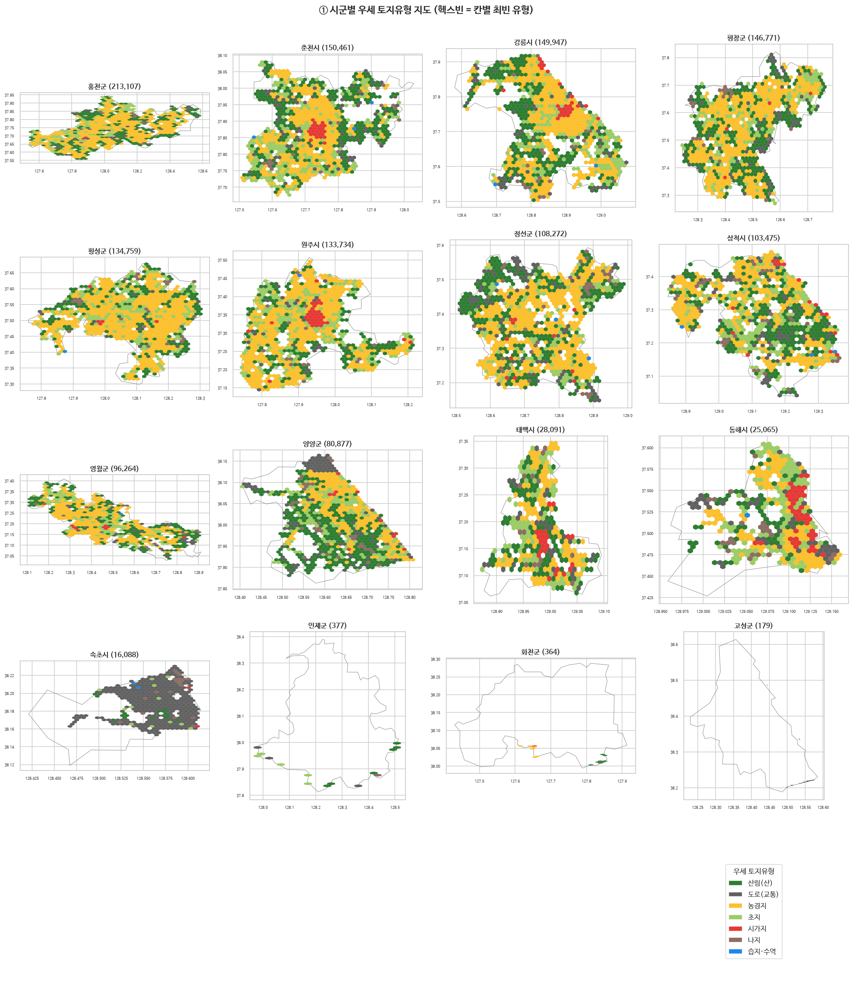

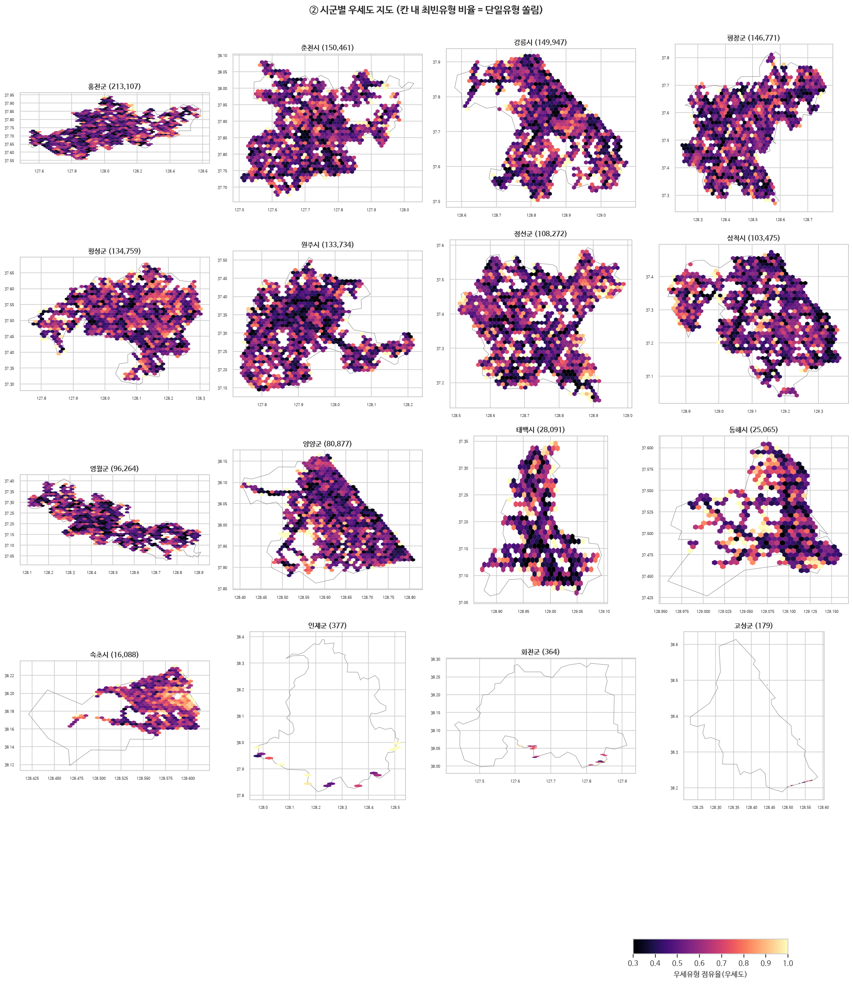

In [31]:
# ── 시군별 서브플롯: ① 우세 토지유형 + ② 우세도(점유율) 지도 동시 ──
import polars as pl, numpy as np, pandas as pd
import matplotlib.pyplot as plt, matplotlib.font_manager as fm
import geopandas as gpd
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

L2_GROUP = {
    "150": "도로(교통)",
    "310": "산림(산)", "320": "산림(산)", "330": "산림(산)",
    "210": "농경지", "220": "농경지", "230": "농경지", "240": "농경지", "250": "농경지",
    "410": "초지", "420": "초지", "430": "초지",
    "110": "시가지", "120": "시가지", "130": "시가지", "140": "시가지", "160": "시가지",
    "610": "나지", "620": "나지",
    "510": "습지·수역", "520": "습지·수역", "710": "습지·수역", "720": "습지·수역",
}
ORDER = ["산림(산)", "도로(교통)", "농경지", "초지", "시가지", "나지", "습지·수역"]
COLOR = dict(zip(ORDER, ["#2e7d32", "#616161", "#fbc02d", "#9ccc65",
                         "#e53935", "#8d6e63", "#1e88e5"]))
code = {t: i for i, t in enumerate(ORDER)}

df = (pl.read_parquet(POLES / "pole_features.parquet", columns=["pole_id", "lon", "lat"])
      .join(pl.read_parquet(POLES / "pole_landcover_filled.parquet").select(["pole_id", "l2_code"]), on="pole_id", how="left")
      .join(pl.read_parquet(POLES / "pole_sgg.parquet"), on="pole_id", how="left")
      .with_columns([pl.col("sgg").fill_null("미상"),
                     pl.col("l2_code").replace_strict(L2_GROUP, default="기타").alias("유형")])).to_pandas()
df["tc"] = df["유형"].map(code).values

adf = pd.read_csv(ADMIN / "admin_gangwon.csv")
admin = gpd.GeoDataFrame(adf, geometry=gpd.GeoSeries.from_wkt(adf["wkt"]), crs=4326).set_index("sig_kor_nm")
short2full = {n[:-1]: n for n in admin.index if len(n) > 1}
SGG = df["sgg"].value_counts().index.tolist()
cmap = ListedColormap([COLOR[t] for t in ORDER])
norm = BoundaryNorm(np.arange(-.5, len(ORDER) + .5), cmap.N)

def hmode(a):  # 칸 내 최빈 유형 코드
    return np.bincount(np.asarray(a, dtype=int), minlength=len(ORDER)).argmax()

def hshare(a):  # 칸 내 최빈유형 점유율(우세도)
    c = np.bincount(np.asarray(a, dtype=int), minlength=len(ORDER))
    return c.max() / c.sum()

def bounds(full, d):
    if full in admin.index:
        mnx, mny, mxx, mxy = admin.loc[full, "geometry"].bounds
        mx, my = (mxx - mnx) * .05, (mxy - mny) * .05
        return mnx - mx, mxx + mx, mny - my, mxy + my
    return d.lon.min(), d.lon.max(), d.lat.min(), d.lat.max()

def city_grid(mode):
    fig, axes = plt.subplots(5, 4, figsize=(19, 22)); axf = axes.ravel(); hb = None
    for i, s in enumerate(SGG):
        ax = axf[i]; d = df[df["sgg"] == s]; full = short2full.get(s, s)
        if full in admin.index:
            gpd.GeoSeries([admin.loc[full, "geometry"]], crs=4326).plot(
                ax=ax, facecolor="none", edgecolor="0.5", lw=0.6, zorder=1)
        gs = 18 if len(d) < 2000 else (28 if len(d) < 50000 else 40)
        if mode == "dom":
            ax.hexbin(d.lon, d.lat, C=d.tc.values, reduce_C_function=hmode,
                      gridsize=gs, cmap=cmap, norm=norm, mincnt=1, linewidths=0.1, zorder=2)
        else:
            hb = ax.hexbin(d.lon, d.lat, C=d.tc.values, reduce_C_function=hshare,
                           gridsize=gs, cmap="magma", vmin=0.3, vmax=1.0, mincnt=1, linewidths=0.1, zorder=2)
        x0, x1, y0, y1 = bounds(full, d)
        ax.set_xlim(x0, x1); ax.set_ylim(y0, y1); ax.set_aspect("equal")
        ax.set_title(f"{full} ({len(d):,})", fontsize=11, weight="bold"); ax.tick_params(labelsize=6)
    for j in range(len(SGG), len(axf)):
        axf[j].axis("off")
    if mode == "dom":
        axf[-1].legend(handles=[Patch(facecolor=COLOR[t], label=t) for t in ORDER],
                       loc="center", fontsize=11, title="우세 토지유형")
        fig.suptitle("① 시군별 우세 토지유형 지도 (헥스빈 = 칸별 최빈 유형)", fontsize=16, weight="bold", y=1.002)
        plt.tight_layout()
    else:
        fig.suptitle("② 시군별 우세도 지도 (칸 내 최빈유형 비율 = 단일유형 쏠림)", fontsize=16, weight="bold", y=1.002)
        plt.tight_layout()
        cax = fig.add_axes([0.74, 0.05, 0.18, 0.015])
        fig.colorbar(hb, cax=cax, orientation="horizontal", label="우세유형 점유율(우세도)")
    plt.show()

city_grid("dom")     # ① 어떤 유형이 우세한가
city_grid("share")   # ② 얼마나 단일유형으로 쏠렸나


## A. 발화점(산불 발생) 분포 EDA — 어디서·언제·무슨 땅에서 불이 나나

과제 타깃은 전주 화재위험 = **발화(ignition)**. safemap 산불발생이력(강원 916, 2015~2024, 좌표·원인·면적)으로 발화점이 **토지·시간·지역·지형**에 따라 어떻게 분포하는지 본다. (확산 형상은 §B에서 dNBR로 별도 검증.)

- **발화점 91%가 산림** — 산불은 산에서 난다. 반면 전주는 농경·도로 위주(산림 18%) → **핵심은 "산림 근처 전주"**(모델의 `dist_to_forest`·연료 S_p와 직결).
- **봄(3~5월) 59%** 집중, 4월 피크 — 양간지풍·건조·인간발화.
- 원인 압도적 **인간발화**(입산자실화·소각), **전기·설비 27건**(전주 직결).
- 발화점 지형은 산불 *크기*를 거의 못 정함(기상이 좌우) → 위험은 발화확률 중심, 지형은 보조.


findfont: Failed to find font weight bold, now using 600.


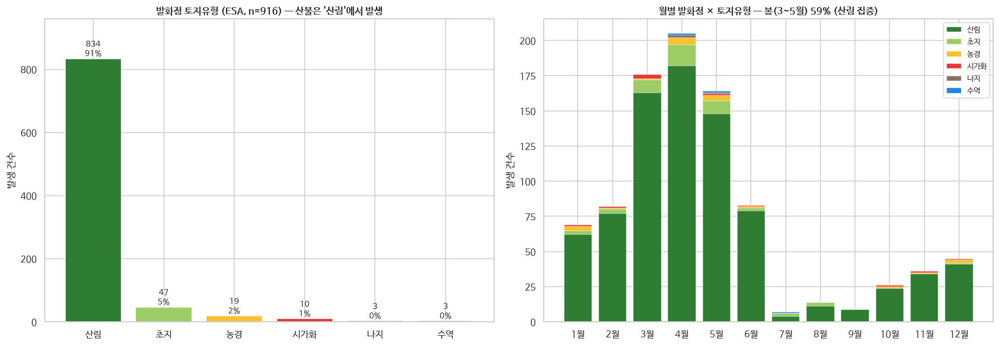

In [32]:
# ── A-1. 발화점 × 토지유형 × 시간 — 산불은 '산림'에서, '봄'에 난다 ──
# 발화 위치의 실제 토지피복(ESA WorldCover) — GEE로 safemap 발화점에 표집한 캐시 사용.
import pandas as pd, numpy as np
import matplotlib.pyplot as plt, matplotlib.font_manager as fm

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

sm = pd.read_parquet(FIRE / "safemap_fire_landcover.parquet")   # 발화점+ESA 토지+월
ORDER = ["산림", "초지", "농경", "시가화", "나지", "수역", "습지"]
COLOR = dict(zip(ORDER, ["#2e7d32", "#9ccc65", "#fbc02d", "#e53935", "#8d6e63", "#1e88e5", "#26c6da"]))
cats = [c for c in ORDER if c in sm["토지"].unique()]
N = len(sm)

fig, ax = plt.subplots(1, 2, figsize=(17, 6))
# (좌) 발화점 토지유형
vc = sm["토지"].value_counts().reindex(cats)
ax[0].bar(cats, vc.values, color=[COLOR[c] for c in cats], edgecolor="white")
for i, c in enumerate(cats): ax[0].text(i, vc[c], f"{vc[c]}\n{vc[c]/N*100:.0f}%", ha="center", va="bottom", fontsize=10)
ax[0].set_title(f"발화점 토지유형 (ESA, n={N}) — 산불은 '산림'에서 발생", fontsize=12, weight="bold")
ax[0].set_ylabel("발생 건수"); ax[0].margins(y=0.15)
# (우) 월별 발화점 × 토지유형(누적)
mt = sm.dropna(subset=["월"])
piv = mt.pivot_table(index="월", columns="토지", aggfunc="size", fill_value=0).reindex(range(1, 13), fill_value=0)
bottom = np.zeros(12)
for c in cats:
    if c in piv.columns:
        ax[1].bar(range(1, 13), piv[c].values, bottom=bottom, color=COLOR[c], label=c, edgecolor="white", linewidth=.3)
        bottom += piv[c].values
ax[1].set_xticks(range(1, 13)); ax[1].set_xticklabels([f"{m}월" for m in range(1, 13)])
sp = mt["월"].isin([3, 4, 5]).mean()
ax[1].set_title(f"월별 발화점 × 토지유형 — 봄(3~5월) {sp*100:.0f}% (산림 집중)", fontsize=12, weight="bold")
ax[1].set_ylabel("발생 건수"); ax[1].legend(fontsize=9)
plt.tight_layout(); plt.show()


findfont: Failed to find font weight bold, now using 600.


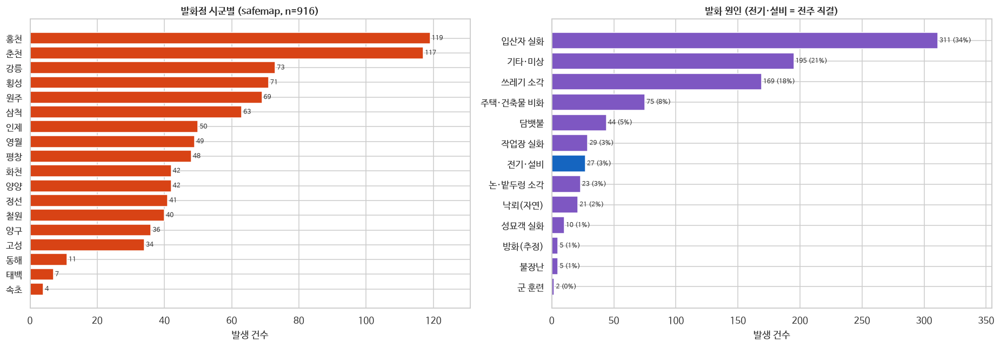

In [33]:
# ── A-2. 발화점 시군별 + 발화 원인(resn) ──
import pandas as pd, numpy as np
import matplotlib.pyplot as plt, matplotlib.font_manager as fm

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

sm = pd.read_parquet(FIRE / "safemap_positives.parquet")
short = lambda n: n[:-1] if isinstance(n, str) and n and n[-1] in "시군구" else n
GW18 = {"춘천","원주","강릉","동해","태백","속초","삼척","홍천","횡성","영월",
        "평창","정선","철원","화천","양구","인제","고성","양양"}
sm["시군"] = sm["adres"].str.split().str[1].map(short)
sm = sm[sm["시군"].isin(GW18)].copy()

def cause(r):                                  # resn 자유텍스트 → 표준 원인군(키워드 매핑)
    s = str(r)
    if any(k in s for k in ["전선","전주","특고압","아크","스파크","합선","배전","누선","전차선","혼촉","계량기","단락","전기"]): return "전기·설비"
    if "입산" in s or "등산" in s: return "입산자 실화"
    if "성묘" in s or "묘" in s:   return "성묘객 실화"
    if any(k in s for k in ["담배","담뱃","꽁초"]): return "담뱃불"
    if any(k in s for k in ["논","밭","두렁","영농"]): return "논·밭두렁 소각"
    if any(k in s for k in ["소각","쓰레기","재 투기","재투기","아궁이"]): return "쓰레기 소각"
    if any(k in s for k in ["용접","벌채","예초","산림사업","작업"]): return "작업장 실화"
    if "방화" in s: return "방화(추정)"
    if any(k in s for k in ["어린이","불장난","폭죽","푹죽"]): return "불장난"
    if any(k in s for k in ["비화","비산","난로","보일러","난방","주택","건축","화목"]): return "주택·건축물 비화"
    if "군사" in s or "훈련" in s: return "군 훈련"
    if "낙뢰" in s: return "낙뢰(자연)"
    return "기타·미상"
sm["원인군"] = sm["resn"].map(cause)
N = len(sm)

fig, ax = plt.subplots(1, 2, figsize=(17, 6))
vc = sm["시군"].value_counts()
ax[0].barh(vc.index[::-1], vc.values[::-1], color="#d84315")
for i, v in enumerate(vc.values[::-1]): ax[0].text(v, i, f" {v}", va="center", fontsize=8)
ax[0].set_title(f"발화점 시군별 (safemap, n={N})", fontsize=12, weight="bold"); ax[0].set_xlabel("발생 건수"); ax[0].margins(x=0.1)
rc = sm["원인군"].value_counts()
colr = ["#1565c0" if c == "전기·설비" else "#7e57c2" for c in rc.index]
ax[1].barh(rc.index[::-1], rc.values[::-1], color=colr[::-1], edgecolor="white")
for i, v in enumerate(rc.values[::-1]): ax[1].text(v, i, f" {v} ({v/N*100:.0f}%)", va="center", fontsize=8)
ax[1].set_title("발화 원인 (전기·설비 = 전주 직결)", fontsize=12, weight="bold"); ax[1].set_xlabel("발생 건수"); ax[1].margins(x=0.14)
plt.tight_layout(); plt.show()


findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


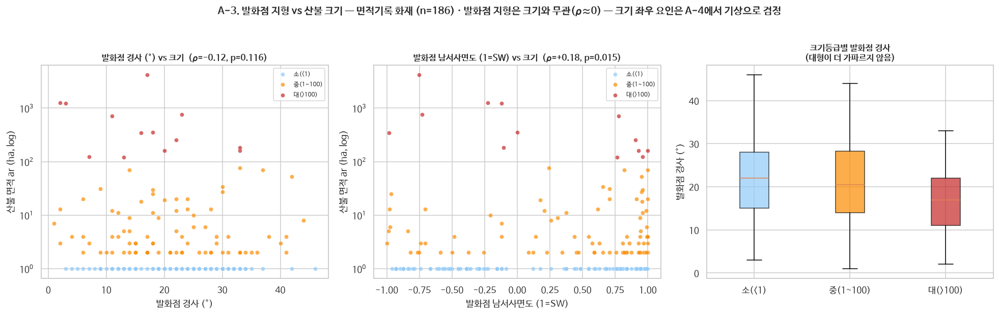

In [34]:
# ── A-3. 발화점 지형 ↔ 산불 크기(ar) — 발화점 DEM 표집(GEE)본, 캐시만 읽음 ──
# (캐시 생성: SRTM DEM을 safemap 면적기록 화재 발화점에 표집 → safemap_fire_terrain.parquet)
import pandas as pd, numpy as np
from scipy.stats import spearmanr
import matplotlib.pyplot as plt, matplotlib.font_manager as fm

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

fire = pd.read_parquet(FIRE / "safemap_fire_terrain.parquet")
C = {"소(<1)": "#90caf9", "중(1~100)": "#fb8c00", "대(>100)": "#c62828"}
fig, ax = plt.subplots(1, 3, figsize=(18, 5.5))
for a, (xc, xl) in zip(ax[:2], [("slope", "발화점 경사 (°)"), ("sw", "발화점 남서사면도 (1=SW)")]):
    for g, c in C.items():
        s = fire[fire["등급"] == g]
        a.scatter(s[xc], s["ar"], c=c, s=28, alpha=.7, label=g, edgecolor="white", lw=.3)
    rho, p = spearmanr(fire[xc], fire["ar"])
    a.set_yscale("log"); a.set_xlabel(xl); a.set_ylabel("산불 면적 ar (ha, log)")
    a.set_title(f"{xl} vs 크기  (ρ={rho:+.2f}, p={p:.3f})", fontsize=11, weight="bold"); a.legend(fontsize=8)
data = [fire[fire["등급"] == g]["slope"].values for g in C]
bp = ax[2].boxplot(data, tick_labels=list(C), patch_artist=True, showfliers=False)
for patch, c in zip(bp["boxes"], C.values()): patch.set_facecolor(c); patch.set_alpha(.7)
ax[2].set_ylabel("발화점 경사 (°)"); ax[2].set_title("크기등급별 발화점 경사\n(대형이 더 가파르지 않음)", fontsize=11, weight="bold")
fig.suptitle(f"A-3. 발화점 지형 vs 산불 크기 — 면적기록 화재 (n={len(fire)}) · 발화점 지형은 크기와 무관(ρ≈0) — 크기 좌우 요인은 A-4에서 기상으로 검정",
             fontsize=13, weight="bold", y=1.02)
plt.tight_layout(); plt.show()


### A-4. 화재 크기는 발화점 지형이 아니라 '바람·ISI(확산)'가 좌우 — 데이터 검정 (관측 기반)

A-3의 "발화점 지형 ⊥ 크기"를 넘어, 화재 **당일·위치**의 기상을 직접 조인해 검정한다.
캐시 `safemap_fire_weather.parquet` = safemap 화재(정확 일자 `occu_date`) × 최근접 AWS 일자료(`pf.aws_obs_daily`) + **관측 기반 FWI**(`fwi_obs.py` — 예보격자 아님, 관측으로 새로 계산).
**결과** (n=135, 2015~24): 화재당일 **풍속 ρ=+0.29 (p=0.001)** · 관측 **ISI(초기확산=바람×세연료) +0.26 (p=0.002)** — 둘 다 유의. 반면 **FWI 전체 +0.08 · FFMC · BUI는 무의미** → 산불 크기는 *wind-driven 확산성분*(바람·ISI)이 좌우하지 누적건조(BUI)가 아니다. 발화점 경사 ρ≈0, 당일강수 전부 0(화재=마른 날).
*검증*: 관측 FWI vs 기존 **예보격자** FWI 겹친 30건 **ρ=+0.86**(계산 일치). *주의*: 탐색적 상관(인과 아님) · 최근접 관측소 5.7km · 발화점 기상(확산기간 아님) · n=135 · `ar` 극왜곡.

findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


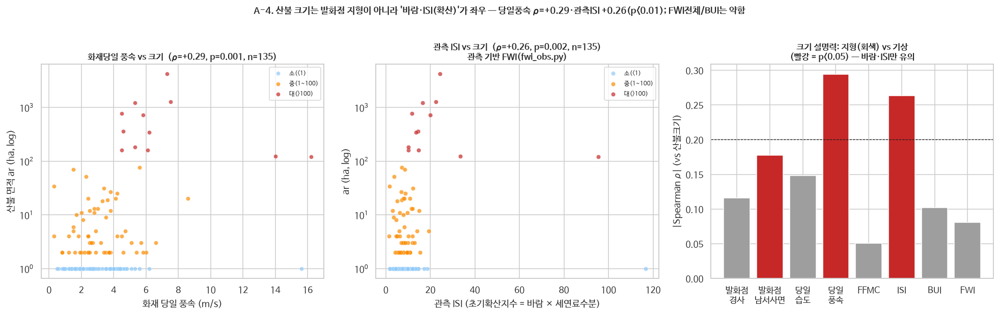

=== 산불크기(ar) Spearman 상관 (지형 vs 기상; 관측 FWI) ===
  발화점
경사   ρ=-0.116  p=0.116  n=186
  발화점
남서사면 ρ=+0.178  p=0.015  n=186 *유의
  당일
습도    ρ=-0.148  p=0.086  n=135
  당일
풍속    ρ=+0.294  p=0.001  n=135 *유의
  FFMC     ρ=+0.050  p=0.562  n=135
  ISI      ρ=+0.264  p=0.002  n=135 *유의
  BUI      ρ=-0.102  p=0.240  n=135
  FWI      ρ=+0.081  p=0.351  n=135
→ 바람·ISI(wind-driven 확산)만 유의 / 발화점 지형·FWI전체·BUI는 무관 ⇒ '기상(바람)이 크기 좌우' 데이터 지지


In [35]:
# ── A-4. 화재 당일 기상 ↔ 산불 크기 — "기상이 크기 좌우" 데이터 검정 (관측 기반 FWI) ──
# 캐시: safemap 화재(정확 일자) × 최근접 AWS 일자료 + 관측 FWI(fwi_obs.py) → safemap_fire_weather.parquet
import pandas as pd, numpy as np
from scipy.stats import spearmanr
import matplotlib.pyplot as plt, matplotlib.font_manager as fm

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

fw = pd.read_parquet(FIRE / "safemap_fire_weather.parquet")
C = {"소(<1)": "#90caf9", "중(1~100)": "#fb8c00", "대(>100)": "#c62828"}

def rho(df, x):
    s = df.dropna(subset=[x, "ar"])
    if s[x].nunique() < 2:
        return np.nan, np.nan, len(s)
    r, p = spearmanr(s[x], s["ar"]); return r, p, len(s)

fig, ax = plt.subplots(1, 3, figsize=(18, 5.5))
# (1) 화재당일 풍속 vs ar
aws = fw.dropna(subset=["ws", "ar"])
for g, c in C.items():
    s = aws[aws["등급"] == g]; ax[0].scatter(s["ws"], s["ar"], c=c, s=28, alpha=.7, label=g, edgecolor="white", lw=.3)
r, p, n = rho(aws, "ws"); ax[0].set_yscale("log")
ax[0].set_xlabel("화재 당일 풍속 (m/s)"); ax[0].set_ylabel("산불 면적 ar (ha, log)")
ax[0].set_title(f"화재당일 풍속 vs 크기  (ρ={r:+.2f}, p={p:.3f}, n={n})", fontsize=11, weight="bold"); ax[0].legend(fontsize=8)
# (2) 관측 ISI vs ar (관측 기반 FWI, 2015~24 전기간)
gf = fw.dropna(subset=["isi_obs", "ar"])
for g, c in C.items():
    s = gf[gf["등급"] == g]; ax[1].scatter(s["isi_obs"], s["ar"], c=c, s=30, alpha=.7, label=g, edgecolor="white", lw=.3)
r, p, n = rho(gf, "isi_obs"); ax[1].set_yscale("log")
ax[1].set_xlabel("관측 ISI (초기확산지수 = 바람 × 세연료수분)"); ax[1].set_ylabel("ar (ha, log)")
ax[1].set_title(f"관측 ISI vs 크기  (ρ={r:+.2f}, p={p:.3f}, n={n})\n관측 기반 FWI(fwi_obs.py)", fontsize=11, weight="bold"); ax[1].legend(fontsize=8)
# (3) |ρ| 비교 — 지형(회색) vs 기상(빨강=p<0.05)
specs = [("slope", "발화점\n경사"), ("sw", "발화점\n남서사면"), ("hm", "당일\n습도"),
         ("ws", "당일\n풍속"), ("ffmc_obs", "FFMC"), ("isi_obs", "ISI"), ("bui_obs", "BUI"), ("fwi_obs", "FWI")]
labels, rhos, cols = [], [], []
for x, lab in specs:
    r, p, n = rho(fw, x); labels.append(lab)
    rhos.append(abs(r) if not np.isnan(r) else 0.0)
    cols.append("#c62828" if (not np.isnan(p) and p < 0.05) else "#9e9e9e")
ax[2].bar(labels, rhos, color=cols, edgecolor="white")
ax[2].axhline(0.2, ls="--", color="k", lw=.8)
ax[2].set_ylabel("|Spearman ρ| (vs 산불크기)")
ax[2].set_title("크기 설명력: 지형(회색) vs 기상\n(빨강 = p<0.05) — 바람·ISI만 유의", fontsize=11, weight="bold")
fig.suptitle("A-4. 산불 크기는 발화점 지형이 아니라 '바람·ISI(확산)'가 좌우 — 당일풍속 ρ=+0.29·관측ISI +0.26(p<0.01); FWI전체/BUI는 약함",
             fontsize=12, weight="bold", y=1.02)
plt.tight_layout(); plt.show()

print("=== 산불크기(ar) Spearman 상관 (지형 vs 기상; 관측 FWI) ===")
for x, lab in specs:
    r, p, n = rho(fw, x); flag = " *유의" if (not np.isnan(p) and p < 0.05) else ""
    print(f"  {lab.replace(chr(92)+'n',''):8s} ρ={r:+.3f}  p={p:.3f}  n={n}{flag}")
print("→ 바람·ISI(wind-driven 확산)만 유의 / 발화점 지형·FWI전체·BUI는 무관 ⇒ '기상(바람)이 크기 좌우' 데이터 지지")

## B. 산불 확산 ↔ 지형 — Sentinel-2 dNBR 파일럿 (2019 고성·속초, 강원)

발화지점(safemap)은 있으나 확산 형상이 없어 **Sentinel-2 dNBR**(발화 전/후 NBR 차분)로 burn-scar를 직접 추출.
파일럿 = **2019 고성·속초 산불**(전 구간 강원, **발화원 = KEPCO 특고압선 아크** → 전주 설비발화 직결, 양간지풍 대형화).

- **dNBR≥0.27 = 1,052 ha = 공식(고성 936 + 속초 330 = 1,266 ha)의 83%**, 발화점이 스카 서쪽 끝과 일치 ✅
- **burn 안 vs 밖 → 불은 남서사면으로 퍼짐** (남서사면도 −0.59→−0.22, p=5e−13) — 2022 울진·삼척(82% 검증)과 **동일 패턴 재현** 🎯
- 단 경사·고도는 반대(불탐이 더 낮고 완만): 양간지풍이 해안 저지대로 내리몰아서 → **aspect(남서)가 일관 신호, slope/elev는 화재별(바람 지배)**
- 봄 화재 dNBR 주의: pre=전년 봄(2017·2018), post=화재 직후(2019-04~05)로 **위상 맞춤**(눈·신록 노이즈 회피). FIRMS는 2019 미보유 → **safemap 발화점·공식면적**으로 검증.

셀: **B-1**(GEE 1회 → geojson·parquet) → **B-2**(burn-scar 시군별·발화점) → **B-3**(안/밖 지형).


In [36]:
# ── B-1. (GEE, 1회 실행) 2019 고성·속초 산불 dNBR → burn 폴리곤 + 지형 표집 ──
# ※ 결과물(burn geojson + 지형 parquet)은 used_dataset/burn/ 에 이미 캐시되어 있음 → 평소엔 자동 스킵.
#   재생성하려면 REGEN=True. 단 실행에는 earthengine-api(ee) + GEE 인증 + pfire(PF-EBM-OR/src)가 필요.
# 봄 화재라 pre=전년 봄들(2017·2018), post=화재 직후(2019-04~05)로 위상 맞춤(눈·신록 회피).
# FIRMS는 2019 미보유 → 검증은 safemap 발화점 + 공식면적(고성 936 + 속초 330 = 1,266 ha).
import importlib.util as _u

REGEN = False                                            # True로 바꾸면 GEE로 캐시 재생성
_geojson = BURN / "burn_goseong_2019_dnbr.geojson"
_terrain = BURN / "burn_goseong_terrain_sample.parquet"

if not REGEN and _geojson.exists() and _terrain.exists():
    print(f"[B-1 스킵] 캐시 이미 존재 → {_geojson.name}, {_terrain.name}  (재생성하려면 REGEN=True)")
elif _u.find_spec("ee") is None or _u.find_spec("pfire") is None:
    print("[B-1 스킵] earthengine-api(ee) 또는 pfire 미설치 → GEE 재생성 불가. 기존 캐시 사용.")
else:
    import ee, json, numpy as np, pandas as pd
    from pfire.collect_s2 import _init_ee
    _init_ee(ee, None)
    BURN.mkdir(parents=True, exist_ok=True)              # 출력 폴더 보장(이미 있으면 무시)

    AOI = ee.Geometry.Rectangle([128.44, 38.12, 128.60, 38.30])
    IGN = ee.Geometry.Point([128.5029, 38.2063])   # safemap 발화점(고성 토성면 원암리, KEPCO 전선아크)
    def _mask(img):
        scl = img.select("SCL")
        keep = scl.neq(3).And(scl.neq(8)).And(scl.neq(9)).And(scl.neq(10)).And(scl.neq(11))  # 그림자·구름·눈 제외
        return img.updateMask(keep).divide(10000)
    def _col(s, e):
        return (ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED").filterBounds(AOI).filterDate(s, e)
                .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", 60)).map(_mask))
    # 위상 맞춤 dNBR: pre = 전년 봄(2017+2018), post = 화재 직후(2019)
    pre  = _col("2017-03-15", "2017-05-31").merge(_col("2018-03-15", "2018-05-31")).median().normalizedDifference(["B8", "B12"])
    post = _col("2019-04-08", "2019-05-15").median().normalizedDifference(["B8", "B12"])
    dnbr = pre.subtract(post).rename("dnbr")
    burn = dnbr.gt(0.27)                                  # 봄화재 노이즈 회피 위해 임계 0.27

    ha = burn.multiply(ee.Image.pixelArea()).reduceRegion(ee.Reducer.sum(), AOI, 20, maxPixels=1e10).getInfo()["dnbr"] / 1e4
    print(f"dNBR>0.27 면적: {ha:.0f} ha (공식 1,266 대비 {100*ha/1266:.0f}%)")
    print(f"발화점 dNBR: {dnbr.reduceRegion(ee.Reducer.mean(), IGN.buffer(150), 20).getInfo()['dnbr']:.2f} (>0 면 스카 내부)")

    # burn 폴리곤(>5ha, 발화점 6km 내 = 화재 본체) → geojson
    vec = burn.selfMask().reduceToVectors(
        geometry=AOI, scale=30, geometryType="polygon", maxPixels=1e10, bestEffort=True, eightConnected=True)
    vec = vec.map(lambda f: f.set("ha", f.geometry().area(30).divide(1e4)))
    big = vec.filter(ee.Filter.gt("ha", 5)).filterBounds(IGN.buffer(6000))   # 발화점서 먼 비화재 패치 제거
    json.dump(big.geometry().simplify(20).getInfo(), open(_geojson, "w"))

    # burned/unburned 지형(SRTM) 층화표집 → parquet
    terr = ee.Terrain.products(ee.Image("USGS/SRTMGL1_003")).select(["elevation", "slope", "aspect"])
    samp = burn.rename("burn").toInt().addBands(terr).stratifiedSample(
        numPoints=2000, classBand="burn", region=AOI, scale=30, seed=1, geometries=False)
    ts = pd.DataFrame([f["properties"] for f in samp.getInfo()["features"]])
    ts["sw"] = np.cos(np.radians(ts["aspect"] - 225))     # 남서사면도(1=SW, -1=NE)
    ts.to_parquet(_terrain)
    print("저장 완료:", _geojson.name, _terrain.name)

[B-1 스킵] 캐시 이미 존재 → burn_goseong_2019_dnbr.geojson, burn_goseong_terrain_sample.parquet  (재생성하려면 REGEN=True)


findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


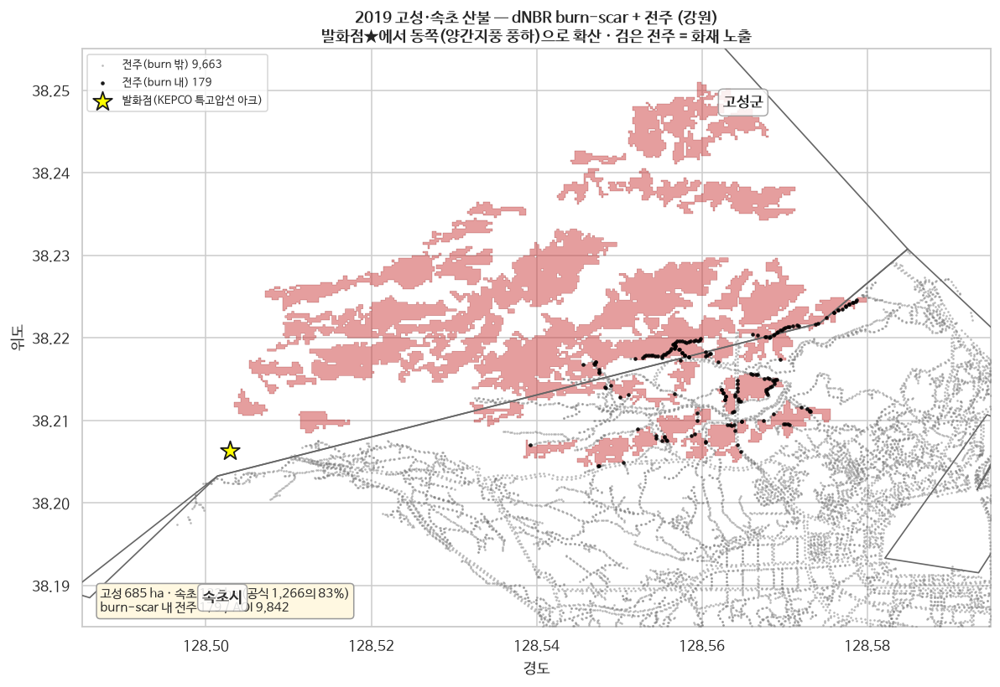

In [37]:
# ── B-2. 2019 고성·속초 burn-scar + 전주 + 발화점 — 캐시만 읽음 ──
# 과제 직결: burn-scar 안에 든 전주 = 그 화재에 직접 노출된 전주.
import json, geopandas as gpd, pandas as pd
from shapely.geometry import shape, box
import matplotlib.pyplot as plt, matplotlib.font_manager as fm

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

burn = shape(json.load(open(BURN / "burn_goseong_2019_dnbr.geojson")))   # B-1에서 생성
X0, Y0, X1, Y1 = 128.485, 38.185, 128.595, 38.255                              # 화재로 타이트 크롭
adf = pd.read_csv(ADMIN / "admin_gangwon.csv")
admin = gpd.GeoDataFrame(adf, geometry=gpd.GeoSeries.from_wkt(adf["wkt"]), crs=4326)
near = admin[admin.intersects(box(X0, Y0, X1, Y1))]
bm = gpd.GeoSeries([burn], crs=4326).to_crs(5179).iloc[0]
ar = {r["sig_kor_nm"]: gpd.GeoSeries([r.geometry], crs=4326).to_crs(5179).iloc[0].intersection(bm).area / 1e4
      for _, r in near.iterrows()}

# AOI 전주 + burn-scar 내부 여부
poles = pd.read_csv(POLES / "gangwon_poles_4326.csv")
p = poles[poles.lon.between(X0, X1) & poles.lat.between(Y0, Y1)].copy()
p["inside"] = gpd.GeoDataFrame(p, geometry=gpd.points_from_xy(p.lon, p.lat), crs=4326).within(burn).values

fig, ax = plt.subplots(figsize=(11, 7.5))
near.boundary.plot(ax=ax, color="0.4", lw=1.1, zorder=3)
gpd.GeoSeries([burn], crs=4326).plot(ax=ax, facecolor="#c62828", edgecolor="#7f0000", alpha=0.45, lw=0.3, zorder=2)
ax.scatter(p[~p.inside].lon, p[~p.inside].lat, s=3, c="0.45", alpha=0.5, lw=0, zorder=3,
           label=f"전주(burn 밖) {(~p.inside).sum():,}")
ax.scatter(p[p.inside].lon, p[p.inside].lat, s=9, c="black", alpha=0.9, lw=0, zorder=4,
           label=f"전주(burn 내) {p.inside.sum():,}")
ax.scatter([128.5029], [38.2063], s=240, marker="*", c="yellow", edgecolor="k", lw=1.2, zorder=5,
           label="발화점(KEPCO 특고압선 아크)")
ax.text(128.565, 38.248, "고성군", fontsize=12, weight="bold", ha="center", zorder=6,
        bbox=dict(boxstyle="round", fc="white", ec="0.6", alpha=.85))
ax.text(128.502, 38.188, "속초시", fontsize=12, weight="bold", ha="center", zorder=6,
        bbox=dict(boxstyle="round", fc="white", ec="0.6", alpha=.85))
ax.text(0.02, 0.02, f"고성 {ar.get('고성군',0):,.0f} ha · 속초 {ar.get('속초시',0):,.0f} ha (공식 1,266의 83%)\n"
        f"burn-scar 내 전주 {p.inside.sum():,} / AOI {len(p):,}", transform=ax.transAxes, fontsize=9.5, va="bottom",
        bbox=dict(boxstyle="round", fc="#fff8e1", ec="0.6"))
ax.set_xlim(X0, X1); ax.set_ylim(Y0, Y1); ax.set_aspect("equal")
ax.set_title("2019 고성·속초 산불 — dNBR burn-scar + 전주 (강원)\n발화점★에서 동쪽(양간지풍 풍하)으로 확산 · 검은 전주 = 화재 노출",
             fontsize=12.5, weight="bold")
ax.set_xlabel("경도"); ax.set_ylabel("위도"); ax.legend(loc="upper left", fontsize=8.5)
plt.tight_layout(); plt.show()


## C. 강원 기상관측소(ASOS+AWS) 분포 & 기상 영향권

강원 기상관측소 **109지점 = ASOS 15 + 방재 AWS 94** (`data/interim/aws_stations_coords_elev.csv`; 관측자료 보유 107). 좌표는 data.kma `stnGroupPopupAjax.do`(AWS=SFC02·ASOS=SFC01), 고도는 전주와 동일 DEM 샘플.

**Q1. 어느 시/군에 있나** — 지점을 행정경계에 point-in-polygon 매칭. ※ 이전 버전은 AWS 94개만 봐서 '태백=0'이었으나, **태백은 ASOS(216, 714m)로 커버**된다(ASOS 포함 시 전 시군 관측소 보유).

**Q2. 어디까지 영향을 주나** — 지점 해상도(최근접 평균 ~8km ≈ 13km 격자)라 한 셀 안 전주는 같은 기상값을 공유. 전주→최근접 관측소 중앙값 **4.8km**, **10km 초과 7.7%**(= C-3 보간의 `extrap_flag`와 일치), 15km 초과 0%. 즉 기상은 전주 개별이 아니라 격자 단위로 영향하며, 전주 고유 변동은 발화항 I_p가 담당.

findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.
findfont: Failed to find font weight bold, now using 600.


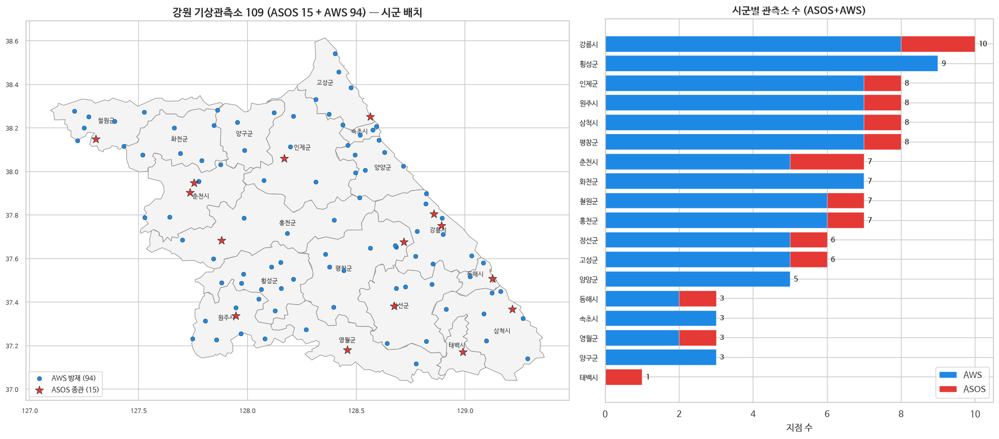

시군별 관측소 수 (ASOS/AWS/합계):
type  ASOS  AWS  합계
sgg                
강릉시      2    8  10
횡성군      0    9   9
인제군      1    7   8
원주시      1    7   8
삼척시      1    7   8
평창군      1    7   8
춘천시      2    5   7
화천군      0    7   7
철원군      1    6   7
홍천군      1    6   7
정선군      1    5   6
고성군      1    5   6
양양군      0    5   5
동해시      1    2   3
속초시      0    3   3
영월군      1    2   3
양구군      0    3   3
태백시      1    0   1

관측소 0개 시군: 없음 — 전 시군이 ASOS/AWS 보유
태백: [{'name': '태백', 'type': 'ASOS', 'elev_dem': 714.0}]


In [38]:
# ── C-1. 강원 기상관측소(ASOS+AWS) 분포 & 시군 배치 — 전체 109지점 ──
# 좌표: aws_stations_coords_elev.csv (ASOS 15 + AWS 94 = 109; 관측자료 107).
# ※ 이전엔 AWS 94만 봐서 '태백=0'이었으나, 태백은 ASOS(216)로 커버됨.
import numpy as np, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt, matplotlib.font_manager as fm
from shapely import wkt as _wkt
from shapely.geometry import Point

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

_a = pd.read_csv(ADMIN / "admin_gangwon.csv"); _a["geometry"] = _a["wkt"].apply(_wkt.loads)
gangwon = gpd.GeoDataFrame(_a, geometry="geometry", crs=4326)
gangwon = gangwon[gangwon["sig_cd"].between(32000, 32999)].copy()
st = pd.read_csv(WEATHER / "aws_stations_coords_elev.csv")
stg = gpd.GeoDataFrame(st, geometry=[Point(xy) for xy in zip(st.lon, st.lat)], crs=4326)

# 지점 → 시군 (point-in-polygon; 경계선상은 최근접 시군 스냅)
j = gpd.sjoin(stg, gangwon[["sig_kor_nm", "geometry"]], how="left", predicate="within").drop(columns="index_right")
gwm = gangwon.to_crs(5179)
for i in j[j["sig_kor_nm"].isna()].index:
    pt = gpd.GeoSeries([stg.geometry[i]], crs=4326).to_crs(5179).iloc[0]
    j.loc[i, "sig_kor_nm"] = gwm.loc[gwm.geometry.distance(pt).idxmin(), "sig_kor_nm"]
st["sgg"] = j["sig_kor_nm"].values

ct = (st.groupby(["sgg", "type"]).size().unstack(fill_value=0)
        .reindex(gangwon["sig_kor_nm"].tolist(), fill_value=0))
for c in ("ASOS", "AWS"):
    if c not in ct.columns: ct[c] = 0
ct["합계"] = ct[["ASOS", "AWS"]].sum(1); ct = ct.sort_values("합계", ascending=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={"width_ratios": [1.4, 1]})
gangwon.plot(ax=ax1, facecolor="#F4F4F4", edgecolor="#888", linewidth=0.7, zorder=1)
aws_, asos_ = st[st.type == "AWS"], st[st.type == "ASOS"]
ax1.scatter(aws_.lon, aws_.lat, s=32, color="#1e88e5", edgecolor="k", linewidth=0.3, zorder=3, label=f"AWS 방재 ({len(aws_)})")
ax1.scatter(asos_.lon, asos_.lat, s=130, color="#e53935", marker="*", edgecolor="k", linewidth=0.5, zorder=4, label=f"ASOS 종관 ({len(asos_)})")
for _, r in gangwon.iterrows():
    c = r.geometry.representative_point(); ax1.annotate(r["sig_kor_nm"], (c.x, c.y), fontsize=8, ha="center", color="#333", zorder=2)
ax1.set_title("강원 기상관측소 109 (ASOS 15 + AWS 94) — 시군 배치", fontsize=14, weight="bold")
ax1.set_aspect("equal"); ax1.legend(fontsize=9, loc="lower left"); ax1.tick_params(labelsize=8)

left = np.zeros(len(ct)); colors = {"ASOS": "#e53935", "AWS": "#1e88e5"}
for c in ("AWS", "ASOS"):
    ax2.barh(range(len(ct)), ct[c].values, left=left, color=colors[c], label=c, edgecolor="white", linewidth=0.3)
    left += ct[c].values
ax2.set_yticks(range(len(ct))); ax2.set_yticklabels(ct.index, fontsize=9); ax2.invert_yaxis()
for i, v in enumerate(ct["합계"].values):
    ax2.text(v + 0.1, i, int(v), va="center", fontsize=9, weight="bold")
ax2.set_title("시군별 관측소 수 (ASOS+AWS)", fontsize=13, weight="bold"); ax2.set_xlabel("지점 수"); ax2.legend()
plt.tight_layout(); plt.show()

print("시군별 관측소 수 (ASOS/AWS/합계):"); print(ct[["ASOS", "AWS", "합계"]].to_string())
zero = [s for s in gangwon["sig_kor_nm"] if ct.loc[s, "합계"] == 0]
print("\n관측소 0개 시군:", zero if zero else "없음 — 전 시군이 ASOS/AWS 보유")
print("태백:", st[st.sgg == "태백시"][["name", "type", "elev_dem"]].to_dict("records"))

findfont: Failed to find font weight bold, now using 600.


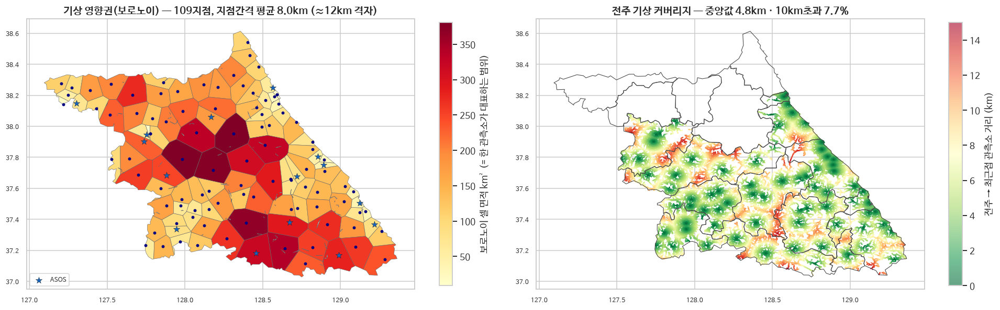

지점 최근접 간격 : 중앙값 7.8km · 평균 8.0km · 최대 19.2km
전주→최근접 관측소: 중앙값 4.8km · p90 9.5km · 최대 15.4km
  10km 초과 전주 : 7.7%   ·   15km 초과 : 0.0%   (ASOS 포함으로 94→109, 이전 15.9%→개선)


In [39]:
# ── C-2. 기상이 어디까지 영향을 주나 — 영향권(보로노이) + 전주 커버리지 (전체 109지점) ──
import numpy as np, polars as pl, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt, matplotlib.font_manager as fm
from shapely import wkt as _wkt
from shapely.geometry import Point, MultiPoint
from shapely.ops import voronoi_diagram, unary_union
from scipy.spatial import cKDTree

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

_a = pd.read_csv(ADMIN / "admin_gangwon.csv"); _a["geometry"] = _a["wkt"].apply(_wkt.loads)
gangwon = gpd.GeoDataFrame(_a, geometry="geometry", crs=4326)
gangwon = gangwon[gangwon["sig_cd"].between(32000, 32999)].copy()
st = pd.read_csv(WEATHER / "aws_stations_coords_elev.csv")   # 109 = ASOS15 + AWS94
aws = gpd.GeoDataFrame(st, geometry=[Point(xy) for xy in zip(st.lon, st.lat)], crs=4326)

# 영향권: 각 지점 보로노이 셀(= 최근접 지점이 대표하는 면적)을 강원 경계로 클립
gw_union = unary_union(gangwon.geometry.values)
_cells = [g.intersection(gw_union) for g in voronoi_diagram(MultiPoint(list(aws.geometry)), envelope=gw_union).geoms]
cg = gpd.GeoDataFrame(geometry=[c for c in _cells if not c.is_empty], crs=4326)
cg["area_km2"] = cg.to_crs(5179).area / 1e6

aws_m = aws.to_crs(5179); _xy = np.c_[aws_m.geometry.x, aws_m.geometry.y]; tree = cKDTree(_xy)
nn = tree.query(_xy, k=2)[0][:, 1] / 1000.0
area_km2 = gangwon.to_crs(5179).area.sum() / 1e6

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
cg.plot(ax=ax1, column="area_km2", cmap="YlOrRd", edgecolor="#666", linewidth=0.4, legend=True,
        legend_kwds={"label": "보로노이 셀 면적 km² (= 한 관측소가 대표하는 범위)", "shrink": 0.6})
_aw, _as = st[st.type == "AWS"], st[st.type == "ASOS"]
ax1.scatter(_aw.lon, _aw.lat, s=8, color="navy", zorder=3)
ax1.scatter(_as.lon, _as.lat, s=70, color="#1565c0", marker="*", edgecolor="k", linewidth=0.3, zorder=4, label="ASOS")
ax1.set_title(f"기상 영향권(보로노이) — 109지점, 지점간격 평균 {nn.mean():.1f}km (≈{np.sqrt(area_km2/len(aws)):.0f}km 격자)",
              fontsize=13, weight="bold")
ax1.set_aspect("equal"); ax1.tick_params(labelsize=8); ax1.legend(fontsize=8, loc="lower left")

p = pl.read_csv(POLES / "gangwon_poles_4326.csv").to_pandas()
pm = gpd.GeoDataFrame(p, geometry=[Point(xy) for xy in zip(p.lon, p.lat)], crs=4326).to_crs(5179)
pkm = tree.query(np.c_[pm.geometry.x, pm.geometry.y], k=1)[0] / 1000.0
samp = np.random.default_rng(1).choice(len(p), size=min(200000, len(p)), replace=False)
sc = ax2.scatter(p.lon.values[samp], p.lat.values[samp], c=pkm[samp], s=2,
                 cmap="RdYlGn_r", vmin=0, vmax=15, alpha=0.6, linewidths=0)
gangwon.plot(ax=ax2, facecolor="none", edgecolor="#444", linewidth=0.7, zorder=2)
plt.colorbar(sc, ax=ax2, shrink=0.6, label="전주 → 최근접 관측소 거리 (km)")
ax2.set_title(f"전주 기상 커버리지 — 중앙값 {np.median(pkm):.1f}km · 10km초과 {(pkm>10).mean()*100:.1f}%",
              fontsize=13, weight="bold")
ax2.set_aspect("equal"); ax2.tick_params(labelsize=8)
plt.tight_layout(); plt.show()

print(f"지점 최근접 간격 : 중앙값 {np.median(nn):.1f}km · 평균 {nn.mean():.1f}km · 최대 {nn.max():.1f}km")
print(f"전주→최근접 관측소: 중앙값 {np.median(pkm):.1f}km · p90 {np.percentile(pkm,90):.1f}km · 최대 {pkm.max():.1f}km")
print(f"  10km 초과 전주 : {(pkm>10).mean()*100:.1f}%   ·   15km 초과 : {(pkm>15).mean()*100:.1f}%   (ASOS 포함으로 94→109, 이전 15.9%→개선)")

### C-3. 고도보정 IDW 보간 결과 — 전주 시즌기온

`src/pfire/interp_weather.py`로 관측기상(107지점)을 **고도보정(detrended) IDW**로 1.38M 전주에 보간한 결과(`pole_weather_obs.parquet`).
- 왼쪽: 전주별 보간 시즌평균 기온 `obs_ta` — **산간일수록 저온, 저지대 고온**(평면 IDW로는 안 나오는 패턴).
- 오른쪽: 전주 고도 vs `obs_ta` — lapse rate ≈ **−5.3°C/km**, corr ≈ **−0.93**. LOSO-CV에서 고지대 기온 RMSE가 평면 IDW 3.55°C → 고도보정 0.81°C(−77%)로 개선됨([검증 리포트](../claudedocs/검증_관측기상보간CV_20260618.md)).

findfont: Failed to find font weight bold, now using 600.


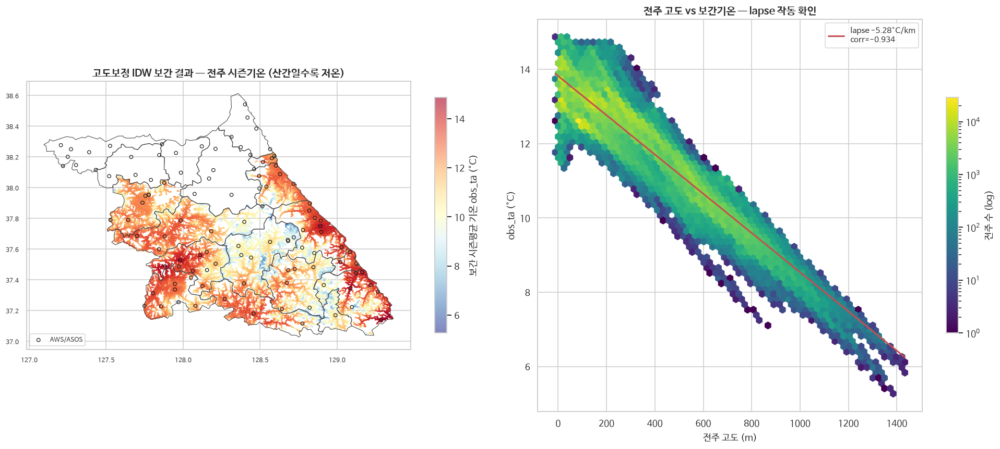

전주 1,387,831개 | obs_ta 5.3~14.9°C | lapse -5.28°C/km · corr(고도,obs_ta)=-0.934 | 외삽 플래그 7.7%


In [40]:
# ── C-3. 고도보정 IDW 보간 결과 (pole_weather_obs.parquet) ──
import numpy as np, polars as pl, pandas as pd, geopandas as gpd
import matplotlib.pyplot as plt, matplotlib.font_manager as fm
from shapely import wkt as _wkt

_font = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
fm.fontManager.addfont(_font)
plt.rcParams["font.family"] = fm.FontProperties(fname=_font).get_name()
plt.rcParams["axes.unicode_minus"] = False

w = pl.read_parquet(WEATHER / "pole_weather_obs.parquet")
f = pl.read_parquet(POLES / "pole_features.parquet", columns=["pole_id", "lon", "lat", "elevation"])
d = w.join(f, on="pole_id").to_pandas()
_a = pd.read_csv(ADMIN / "admin_gangwon.csv"); _a["geometry"] = _a["wkt"].apply(_wkt.loads)
gw = gpd.GeoDataFrame(_a, geometry="geometry", crs=4326); gw = gw[gw["sig_cd"].between(32000, 32999)]
st = pd.read_csv(WEATHER / "aws_stations_coords_elev.csv")

samp = np.random.default_rng(1).choice(len(d), size=200000, replace=False)
ds = d.iloc[samp]
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
sc = ax1.scatter(ds.lon, ds.lat, c=ds.obs_ta, s=2, cmap="RdYlBu_r", alpha=0.6, linewidths=0)
gw.plot(ax=ax1, facecolor="none", edgecolor="#444", linewidth=0.7, zorder=2)
ax1.scatter(st.lon, st.lat, s=18, facecolor="none", edgecolor="k", linewidth=0.8, zorder=3, label="AWS/ASOS")
plt.colorbar(sc, ax=ax1, shrink=0.6, label="보간 시즌평균 기온 obs_ta (°C)")
ax1.set_title("고도보정 IDW 보간 결과 — 전주 시즌기온 (산간일수록 저온)", fontsize=13, weight="bold")
ax1.set_aspect("equal"); ax1.legend(fontsize=8, loc="lower left"); ax1.tick_params(labelsize=8)

hb = ax2.hexbin(d.elevation, d.obs_ta, gridsize=60, cmap="viridis", mincnt=1, bins="log")
b, a = np.polyfit(d.elevation, d.obs_ta, 1)
xs = np.array([d.elevation.min(), d.elevation.max()])
ax2.plot(xs, a + b * xs, "r-", lw=2, label=f"lapse {b*1000:.2f}°C/km\ncorr={np.corrcoef(d.elevation, d.obs_ta)[0,1]:.3f}")
plt.colorbar(hb, ax=ax2, shrink=0.6, label="전주 수 (log)")
ax2.set_xlabel("전주 고도 (m)"); ax2.set_ylabel("obs_ta (°C)")
ax2.set_title("전주 고도 vs 보간기온 — lapse 작동 확인", fontsize=13, weight="bold"); ax2.legend(fontsize=10)
plt.tight_layout(); plt.show()

print(f"전주 {len(d):,}개 | obs_ta {d.obs_ta.min():.1f}~{d.obs_ta.max():.1f}°C | "
      f"lapse {b*1000:.2f}°C/km · corr(고도,obs_ta)={np.corrcoef(d.elevation, d.obs_ta)[0,1]:.3f} | "
      f"외삽 플래그 {d.extrap_flag.mean()*100:.1f}%")